# K-means Clustering

최종 편집 : 2021-09-19

작성자 : 김명준

데이터셋
- K_means Clustering rank_input_dataset(2021.09.19)
- K_means Clustering cat_input_dataset(2021.09.19)

In [1]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from matplotlib import pyplot as plt
import numpy as np
from pandas import DataFrame
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import RobustScaler
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture

from sklearn.metrics.cluster import silhouette_score
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from sklearn.metrics import *
from sklearn.metrics import silhouette_score

In [61]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.tri as tri
def plot_hexagon(row_data_list):
    proportions = row_data_list
    labels = ['sensitive', 'unprepared', 'mediaSharing', 'challenge', 'flex', 'quick']
    N = len(proportions)
    proportions = np.append(proportions, 1)
    theta = np.linspace(0, 2 * np.pi, N, endpoint=False)
    x = np.append(np.sin(theta), 0)
    y = np.append(np.cos(theta), 0)
    triangles = [[N, i, (i + 1) % N] for i in range(N)]
    triang_backgr = tri.Triangulation(x, y, triangles)
    triang_foregr = tri.Triangulation(x * proportions, y * proportions, triangles)
    cmap = plt.cm.rainbow_r  # or plt.cm.hsv ?
    colors = np.linspace(0, 1, N + 1)
    plt.tripcolor(triang_backgr, colors, cmap=cmap, shading='gouraud', alpha=0.4)
    plt.tripcolor(triang_foregr, colors, cmap=cmap, shading='gouraud', alpha=0.8)
    plt.triplot(triang_backgr, color='white', lw=2)
    for label, color, xi, yi in zip(labels, colors, x, y):
        plt.text(xi * 1.05, yi * 1.05, label,  # color=cmap(color),
                 ha='left' if xi > 0.1 else 'right' if xi < -0.1 else 'center',
                 va='bottom' if yi > 0.1 else 'top' if yi < -0.1 else 'center')
    plt.axis('off')
    plt.gca().set_aspect('equal')
    plt.show()

In [2]:
def clustering(n, dataset,Range,clustering_filename):
    kmeanModel = KMeans(n_clusters=n)
    kmeanModel.fit(dataset)
    dataset['cluster_label'] = KMeans(n_clusters = n).fit(dataset).labels_
    dataset.groupby('cluster_label').count()
    
    result_K_n=dataset.groupby('cluster_label').mean()
    cluster_size=dataset.groupby('cluster_label').count()
    cluster_size_K_n = cluster_size.iloc[:,0]
    cluster_size_K_n.plot(kind='bar')
    result_K_n.to_excel(excel_writer='{0}.xlsx'.format(clustering_filename))
    
    name=range(Range)
    result_K_n.columns=name
    cluster_mean=result_K_n.transpose()
    mean_table=cluster_mean.div(cluster_mean.max(axis=1), axis=0)
    
    plt.figure(figsize = (20, 10))    # 히트맵 사이즈 설정
    annot_kws= {'fontsize':12}    # 히트맵 폰트 사이즈 설정
    sns.heatmap(mean_table,     # 히트맵 그릴 데이터셋
            annot=True,     # 레이블 표시 여부
            fmt='.3f',     # 레이블 표시 형식 (소숫점 3째자리까지)
            linewidths = 0.1,     # 히트맵 선 두께
            annot_kws = annot_kws,     # 아까 설정한 폰트 사이즈 적용
            cmap = 'RdYlBu_r')    # 컬러맵 설정
    plt.title('Heatmap', fontsize=13)
    plt.show()
    
    print('Silhouette Coefficient: {:.4f}'.format(metrics.silhouette_score(dataset.iloc[:,:-1], dataset['cluster_label'])))
    print('Davies Bouldin Index: {:.4f}'.format(metrics.davies_bouldin_score(dataset.iloc[:,:-1], dataset['cluster_label'])))

In [3]:
def elbowMethod(dataset):
    distortions = []
    K = range(1,20)
    for k in K:
        kmeansModel = KMeans(n_clusters=k)
        kmeansModel.fit(dataset)
        distortions.append(kmeansModel.inertia_)
        plt.figure(figsize=(16,8))
    plt.plot(K, distortions, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Distortion')
    plt.title('The Elbow Method showing the optimal k')
    plt.show()

In [4]:
def minmax(dataset,filename):
    minMaxScaler = MinMaxScaler()
    print(minMaxScaler.fit(dataset))
    dataset_scaleal_minMaxScaled = minMaxScaler.transform(dataset)
    dataset_minMaxScaled_dataframe=pd.DataFrame(dataset_scaleal_minMaxScaled, columns=dataset.columns)
    dataset_minMaxScaled_dataframe
    dataset_minMaxScaled_dataframe.to_excel(excel_writer='{0}_minMaxScaled.xlsx'.format(filename))

In [5]:
def standard(dataset, filename):
    standardScaler=StandardScaler()
    print(standardScaler.fit(dataset))
    dataset_scaled_standardScaled = standardScaler.transform(dataset)
    dataset_standardScaled_dataframe=pd.DataFrame(dataset_scaled_standardScaled, columns=dataset.columns)
    dataset_standardScaled_dataframe
    dataset_standardScaled_dataframe.to_excel(excel_writer='{0}_standardScaled.xlsx'.format(filename))

In [6]:
### 여러개의 클러스터링 갯수를 List로 입력 받아 각각의 실루엣 계수를 면적으로 시각화한 함수 작성
def visualize_silhouette(cluster_lists, X_features):     
    from sklearn.datasets import make_blobs
    from sklearn.cluster import KMeans
    from sklearn.metrics import silhouette_samples, silhouette_score

    import matplotlib.pyplot as plt
    import matplotlib.cm as cm
    import math
   
    # 입력값으로 클러스터링 갯수들을 리스트로 받아서, 각 갯수별로 클러스터링을 적용하고 실루엣 개수를 구함
    n_cols = len(cluster_lists)
   
    # plt.subplots()으로 리스트에 기재된 클러스터링 수만큼의 sub figures를 가지는 axs 생성 
    fig, axs = plt.subplots(figsize=(4*n_cols, 4), nrows=1, ncols=n_cols)
   
    # 리스트에 기재된 클러스터링 갯수들을 차례로 iteration 수행하면서 실루엣 개수 시각화
    for ind, n_cluster in enumerate(cluster_lists):
       
        # KMeans 클러스터링 수행하고, 실루엣 스코어와 개별 데이터의 실루엣 값 계산. 
        clusterer = KMeans(n_clusters = n_cluster, max_iter=500, random_state=0)
        cluster_labels = clusterer.fit_predict(X_features)
       
        sil_avg = silhouette_score(X_features, cluster_labels)
        sil_values = silhouette_samples(X_features, cluster_labels)
       
        y_lower = 10
        axs[ind].set_title('Number of Cluster : '+ str(n_cluster)+'\n' \
                          'Silhouette Score :' + str(round(sil_avg,3)) )
        axs[ind].set_xlabel("The silhouette coefficient values")
        axs[ind].set_ylabel("Cluster label")
        axs[ind].set_xlim([-0.1, 1])
        axs[ind].set_ylim([0, len(X_features) + (n_cluster + 1) * 10])
        axs[ind].set_yticks([])  # Clear the yaxis labels / ticks
        axs[ind].set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])
       
        # 클러스터링 갯수별로 fill_betweenx( )형태의 막대 그래프 표현. 
        for i in range(n_cluster):
            ith_cluster_sil_values = sil_values[cluster_labels==i]
            ith_cluster_sil_values.sort()
           
            size_cluster_i = ith_cluster_sil_values.shape[0]
            y_upper = y_lower + size_cluster_i
           
            color = cm.nipy_spectral(float(i) / n_cluster)
            axs[ind].fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_sil_values, \
                                facecolor=color, edgecolor=color, alpha=0.7)
            axs[ind].text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            y_lower = y_upper + 10

        axs[ind].axvline(x=sil_avg, color="red", linestyle="--")

# 데이터 전처리

## cat & rank 파생변수 & 파생변수 그룹화 데이터셋 불러오기

cat 데이터의 경우 Hackaton 이전과 변화가 없어 Minmax 처리 된 데이터를 그대로 사용할 예정.

### cat 유형 세부 데이터 불러오기

In [7]:
dataset_cat_several_1 = pd.read_excel("K_means Clustering cat_input_dataset(2021.09.19).xlsx", sheet_name = 'Sheet1',
                             header = 0,
                             index_col = None,
                             usecols="B:F")
dataset_cat_several_1

,room,service,activity,amenity services,convenience
0,3,0,1,1,2
1,2,1,1,1,1
2,5,1,3,3,1
3,6,2,2,2,3
4,5,2,3,0,3
...,...,...,...,...,...
716,6,0,1,0,2
717,5,1,3,0,1
718,3,1,1,1,2
719,2,1,2,1,0


In [8]:
dataset_cat_several_sensitive = pd.read_excel("K_means Clustering cat_input_dataset(2021.09.19).xlsx", sheet_name = 'Sheet1',
                             header = 0,
                             index_col = None,
                             usecols="H:J")
dataset_cat_several_sensitive

,weather sensitive,dense avoidance,exchange avoidance
0,-1.536585,-1.45455,-1.22727
1,-1.536585,1.84091,0.59091
2,1.536585,-1.45455,-1.22727
3,-1.536585,1.84091,0.59091
4,-1.536585,-1.45455,-1.22727
...,...,...,...
716,-1.536585,-1.45455,-1.22727
717,1.536585,-1.45455,-1.22727
718,-1.536585,-1.45455,-1.22727
719,1.536585,1.84091,0.59091


In [9]:
dataset_cat_several_unprepared = pd.read_excel("K_means Clustering cat_input_dataset(2021.09.19).xlsx", sheet_name = 'Sheet1',
                             header = 0,
                             index_col = None,
                             usecols="L:N")
dataset_cat_several_unprepared

,improvised participation,minimal fatigue,simple behavior
0,-0.073171,-0.2439,0.73171
1,-0.073171,-0.2439,0.73171
2,0.073171,0.2439,0.73171
3,-0.073171,-0.2439,0.73171
4,-0.073171,-0.2439,0.73171
...,...,...,...
716,-0.073171,-0.2439,0.73171
717,0.073171,0.2439,0.73171
718,-0.073171,-0.2439,0.73171
719,0.073171,0.2439,0.73171


In [10]:
dataset_cat_several_mediasharing = pd.read_excel("K_means Clustering cat_input_dataset(2021.09.19).xlsx", sheet_name = 'Sheet1',
                             header = 0,
                             index_col = None,
                             usecols="P")
dataset_cat_several_mediasharing

,travel sharing
0,1.29545
1,0.29545
2,1.29545
3,0.29545
4,1.29545
...,...
716,1.29545
717,1.29545
718,1.29545
719,0.29545


In [11]:
dataset_cat_several_challenge = pd.read_excel("K_means Clustering cat_input_dataset(2021.09.19).xlsx", sheet_name = 'Sheet1',
                             header = 0,
                             index_col = None,
                             usecols="R")
dataset_cat_several_challenge

,adventure preference
0,-1.77273
1,2.31818
2,-1.77273
3,2.31818
4,-1.77273
...,...
716,-1.77273
717,-1.77273
718,-1.77273
719,2.31818


In [12]:
dataset_cat_several_flex = pd.read_excel("K_means Clustering cat_input_dataset(2021.09.19).xlsx", sheet_name = 'Sheet1',
                             header = 0,
                             index_col = None,
                             usecols="T:U")
dataset_cat_several_flex

,convenience seeking,resolved investment
0,2.268293,2.219510
1,2.268293,2.219510
2,-2.268293,2.219510
3,2.268293,2.219510
4,2.268293,2.219510
...,...,...
716,2.268293,2.219510
717,-2.268293,2.219510
718,2.268293,2.219510
719,-2.268293,2.219510


In [13]:
dataset_cat_several_quick = pd.read_excel("K_means Clustering cat_input_dataset(2021.09.19).xlsx", sheet_name = 'Sheet1',
                             header = 0,
                             index_col = None,
                             usecols="W")
dataset_cat_several_quick

,simple behavior.1
0,0.73171
1,0.73171
2,0.73171
3,0.73171
4,0.73171
...,...
716,0.73171
717,0.73171
718,0.73171
719,0.73171


cat 유형 세부 성향변수 데이터 합치기

In [17]:
dataset_cat_several_total=pd.concat([dataset_cat_several_sensitive, dataset_cat_several_unprepared, dataset_cat_several_mediasharing
                                    ,dataset_cat_several_challenge, dataset_cat_several_flex], axis=1)
dataset_cat_several_total

,weather sensitive,dense avoidance,exchange avoidance,improvised participation,minimal fatigue,simple behavior,travel sharing,adventure preference,convenience seeking,resolved investment
0,-1.536585,-1.45455,-1.22727,-0.073171,-0.2439,0.73171,1.29545,-1.77273,2.268293,2.219510
1,-1.536585,1.84091,0.59091,-0.073171,-0.2439,0.73171,0.29545,2.31818,2.268293,2.219510
2,1.536585,-1.45455,-1.22727,0.073171,0.2439,0.73171,1.29545,-1.77273,-2.268293,2.219510
3,-1.536585,1.84091,0.59091,-0.073171,-0.2439,0.73171,0.29545,2.31818,2.268293,2.219510
4,-1.536585,-1.45455,-1.22727,-0.073171,-0.2439,0.73171,1.29545,-1.77273,2.268293,2.219510
...,...,...,...,...,...,...,...,...,...,...
716,-1.536585,-1.45455,-1.22727,-0.073171,-0.2439,0.73171,1.29545,-1.77273,2.268293,2.219510
717,1.536585,-1.45455,-1.22727,0.073171,0.2439,0.73171,1.29545,-1.77273,-2.268293,2.219510
718,-1.536585,-1.45455,-1.22727,-0.073171,-0.2439,0.73171,1.29545,-1.77273,2.268293,2.219510
719,1.536585,1.84091,0.59091,0.073171,0.2439,0.73171,0.29545,2.31818,-2.268293,2.219510


### cat 유형 그룹 성향 변수 불러오기

In [20]:
dataset_cat_sensitive = pd.read_excel("K_means Clustering cat_input_dataset(2021.09.19).xlsx", sheet_name = 'Sheet1',
                             header = 0,
                             index_col = None,
                             usecols="G")

dataset_cat_unprepared = pd.read_excel("K_means Clustering cat_input_dataset(2021.09.19).xlsx", sheet_name = 'Sheet1',
                             header = 0,
                             index_col = None,
                             usecols="K")

dataset_cat_mediasharing = pd.read_excel("K_means Clustering cat_input_dataset(2021.09.19).xlsx", sheet_name = 'Sheet1',
                             header = 0,
                             index_col = None,
                             usecols="O")

dataset_cat_challenge = pd.read_excel("K_means Clustering cat_input_dataset(2021.09.19).xlsx", sheet_name = 'Sheet1',
                             header = 0,
                             index_col = None,
                             usecols="Q")

dataset_cat_flex = pd.read_excel("K_means Clustering cat_input_dataset(2021.09.19).xlsx", sheet_name = 'Sheet1',
                             header = 0,
                             index_col = None,
                             usecols="S")

dataset_cat_quick = pd.read_excel("K_means Clustering cat_input_dataset(2021.09.19).xlsx", sheet_name = 'Sheet1',
                             header = 0,
                             index_col = None,
                             usecols="V")

dataset_cat_group_total=pd.concat([dataset_cat_sensitive, dataset_cat_unprepared, dataset_cat_mediasharing, dataset_cat_challenge,
                                  dataset_cat_flex, dataset_cat_quick], axis=1)

dataset_cat_group_total

,sensitive,unprepared,media sharing,challenge,flex,quick
0,-4.218405,0.414639,1.29545,-1.77273,4.487803,0.73171
1,0.895235,0.414639,0.29545,2.31818,4.487803,0.73171
2,-1.145235,1.048781,1.29545,-1.77273,-0.048783,0.73171
3,0.895235,0.414639,0.29545,2.31818,4.487803,0.73171
4,-4.218405,0.414639,1.29545,-1.77273,4.487803,0.73171
...,...,...,...,...,...,...
716,-4.218405,0.414639,1.29545,-1.77273,4.487803,0.73171
717,-1.145235,1.048781,1.29545,-1.77273,-0.048783,0.73171
718,-4.218405,0.414639,1.29545,-1.77273,4.487803,0.73171
719,3.968405,1.048781,0.29545,2.31818,-0.048783,0.73171


### rank 유형 세부 데이터 셋 불러오기

In [21]:
dataset_rank_several = pd.read_excel("K_means Clustering rank_input_dataset(2021.09.19).xlsx", sheet_name = 'Sheet1',
                             header = 0,
                             index_col = None,
                             usecols="B:U")
dataset_rank_several

,restaurant insuitive,external impact,help request,improvised selective,newness seeking,food sharing,visual oriented,avoiding communication,accommodation investment,accommodation selfstand,luxury,fast seeking,service experience,uncomfortable avoidance,plan irregularity,cafe improvisation,review verification,emotional photography,local expericence,cafe investment
0,-1.242424,1.303030,0.818182,-0.537879,1.818182,1.083333,0.954545,-0.348485,-2.439394,-0.340909,2.495935,-1.048780,2.186992,1.691057,-1.349593,-2.040650,1.894309,0.447154,0.674797,2.365854
1,1.151515,0.303030,0.181818,0.431818,1.954545,0.545455,0.250000,2.625000,-2.886364,-1.620455,2.520325,0.382114,2.154472,1.910569,-1.284553,-0.321138,0.085366,0.231707,0.264228,0.357724
2,0.134091,0.406818,0.234091,-0.257576,1.424242,1.056818,1.018939,1.901515,-2.143939,-1.407576,2.325203,-0.451220,2.060976,1.520325,-1.361789,-1.717770,1.581882,1.213705,1.170732,1.630662
3,0.561364,0.113636,-0.645455,-0.537879,1.818182,1.083333,0.954545,1.266414,-2.151515,-1.880682,2.292683,0.019512,2.050407,1.531707,-1.360976,-2.448780,2.212195,1.836585,1.560976,1.956098
4,-0.401515,0.583333,0.272727,-0.430303,0.548485,0.668182,0.677273,0.984217,-2.142677,-1.625631,2.391870,-0.307317,2.113821,1.530081,-1.346341,-0.709930,0.734321,0.360627,0.307491,0.863240
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
716,0.431818,0.810606,-0.856061,-0.219697,0.742424,0.549242,0.397727,1.212121,-2.625000,-1.284091,2.540650,-0.800813,2.195122,1.658537,-1.321138,-2.302439,2.060976,1.460976,1.141463,2.151220
717,0.104545,0.351515,-0.281818,0.034848,0.840909,0.642424,0.593939,1.461490,-2.189394,-1.610480,2.338211,0.245528,2.081301,1.626016,-1.346341,-2.012195,1.734146,1.846341,1.595122,1.780488
718,-1.954545,0.863636,0.363636,-4.204545,-6.272727,-0.022727,1.363636,0.659091,-1.212121,-2.795455,2.585366,-0.552846,2.203252,1.626016,-1.292683,-2.002439,1.734146,1.851220,1.504878,1.751220
719,0.106818,1.479545,0.197727,0.145455,0.142424,0.193939,0.165152,0.500000,-2.500000,-0.579545,2.292683,0.019512,2.050407,1.531707,-1.360976,0.369919,-0.540650,-0.548780,-0.455285,-0.394309


### rank 유형 그룹 성향 변수 데이터셋 불러오기

In [22]:
dataset_rank_group = pd.read_excel("K_means Clustering rank_input_dataset(2021.09.19).xlsx", sheet_name = 'Sheet1',
                             header = 0,
                             index_col = None,
                             usecols="W:AB")
dataset_rank_group

,sensitive,unprepared,media sharing,challenge,flex,quick
0,-0.736511,-7.064856,4.379342,2.970251,4.609387,-1.048780
1,1.017461,-0.107724,1.112528,0.780137,2.146157,0.382114
2,0.788008,-4.784925,4.871344,1.421489,3.872901,-0.451220
3,-0.151657,-5.998466,6.086659,0.853021,4.147672,0.019512
4,0.037469,-3.622411,2.440402,-0.496928,3.226255,-0.307317
...,...,...,...,...,...,...
716,0.364191,-5.472432,4.468921,-0.256264,4.261992,-0.800813
717,0.186989,-4.953289,4.816851,0.543733,4.010606,0.245528
718,-0.103289,-11.188359,4.926275,-7.199667,5.327716,-0.552846
719,0.447838,-0.198134,-0.730340,-0.694678,1.448780,0.019512


# Minmax Normalizing

### cat dataset

세부 유형 변수 minmax Normalizing

In [27]:
minmax(dataset_cat_several_total,"dataset_cat_several_total_20210919")

MinMaxScaler()


그룹 유형 변수 minmax Normalizing

In [28]:
minmax(dataset_cat_group_total,"dataset_cat_group_total_20210919")

MinMaxScaler()


### rank dataset

세부 유형 변수 minmax Normalizing

In [31]:
minmax(dataset_rank_several,"dataset_rank_several_total_20210919")

MinMaxScaler()


그룹 유형 변수 minmax Normalizing

In [32]:
minmax(dataset_rank_group,"dataset_rank_group_total_20210919")

MinMaxScaler()


### Minmax Normalizing 데이터셋 불러오기

cat 세부유형 변수 minmax 데이터셋

In [33]:
dataset_cat_several_minmaxed = pd.read_excel("dataset_cat_several_total_20210919_minMaxScaled.xlsx", sheet_name = 'Sheet1',
                             header = 0,
                             index_col = None,
                             usecols="B:K")
dataset_cat_several_minmaxed

,weather sensitive,dense avoidance,exchange avoidance,improvised participation,minimal fatigue,simple behavior,travel sharing,adventure preference,convenience seeking,resolved investment
0,0,0.0,0,0,0.0,0.300002,1,0,1,1.000000
1,0,1.0,1,0,0.0,0.300002,0,1,1,1.000000
2,1,0.0,0,1,1.0,0.300002,1,0,0,1.000000
3,0,1.0,1,0,0.0,0.300002,0,1,1,1.000000
4,0,0.0,0,0,0.0,0.300002,1,0,1,1.000000
...,...,...,...,...,...,...,...,...,...,...
716,0,0.0,0,0,0.0,0.300002,1,0,1,1.000000
717,1,0.0,0,1,1.0,0.300002,1,0,0,1.000000
718,0,0.0,0,0,0.0,0.300002,1,0,1,1.000000
719,1,1.0,1,1,1.0,0.300002,0,1,0,1.000000


cat 그룹유형 변수 minmax 데이터셋

In [34]:
dataset_cat_group_minmaxed = pd.read_excel("dataset_cat_group_total_20210919_minMaxScaled.xlsx", sheet_name = 'Sheet1',
                             header = 0,
                             index_col = None,
                             usecols="B:G")
dataset_cat_group_minmaxed

,sensitive,unprepared,media sharing,challenge,flex,quick
0,0.000000,0.232760,1,0,1.000000,0.300002
1,0.624619,0.232760,0,1,1.000000,0.300002
2,0.375381,0.456897,1,0,0.497297,0.300002
3,0.624619,0.232760,0,1,1.000000,0.300002
4,0.000000,0.232760,1,0,1.000000,0.300002
...,...,...,...,...,...,...
716,0.000000,0.232760,1,0,1.000000,0.300002
717,0.375381,0.456897,1,0,0.497297,0.300002
718,0.000000,0.232760,1,0,1.000000,0.300002
719,1.000000,0.456897,0,1,0.497297,0.300002


rank 세부유형 변수 minmax 데이터셋

In [35]:
dataset_rank_several_minmaxed = pd.read_excel("dataset_rank_several_total_20210919_minMaxScaled.xlsx", sheet_name = 'Sheet1',
                             header = 0,
                             index_col = None,
                             usecols="B:U")
dataset_rank_several_minmaxed

,restaurant insuitive,external impact,help request,improvised selective,newness seeking,food sharing,visual oriented,avoiding communication,accommodation investment,accommodation selfstand,luxury,fast seeking,service experience,uncomfortable avoidance,plan irregularity,cafe improvisation,review verification,emotional photography,local expericence,cafe investment
0,0.198312,0.771203,0.689922,0.594595,0.988350,0.88640,0.784722,0.280120,0.279221,0.715356,0.919118,0.015823,0.973684,0.747664,0.783784,0.107810,0.899057,0.542254,0.656085,1.000000
1,0.864979,0.510848,0.472868,0.751843,1.000000,0.77280,0.569444,0.871235,0.151515,0.399064,0.941176,0.572785,0.921053,1.000000,1.000000,0.466893,0.479245,0.488934,0.549206,0.481637
2,0.581646,0.537870,0.490698,0.640049,0.954693,0.88080,0.804398,0.727410,0.363636,0.451685,0.764706,0.248418,0.769737,0.551402,0.743243,0.175236,0.826550,0.731963,0.785185,0.810223
3,0.700633,0.461538,0.190698,0.594595,0.988350,0.88640,0.784722,0.601155,0.361472,0.334738,0.735294,0.431646,0.752632,0.564486,0.745946,0.022581,0.972830,0.886117,0.886772,0.894229
4,0.432489,0.583826,0.503876,0.612039,0.879871,0.79872,0.700000,0.545055,0.363997,0.397784,0.825000,0.304430,0.855263,0.562617,0.794595,0.385702,0.629852,0.520839,0.560469,0.612127
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
716,0.664557,0.642998,0.118863,0.646192,0.896440,0.77360,0.614583,0.590361,0.226190,0.482210,0.959559,0.112342,0.986842,0.710280,0.878378,0.053141,0.937736,0.793159,0.777566,0.944596
717,0.573418,0.523471,0.314729,0.687469,0.904854,0.79328,0.674537,0.639935,0.350649,0.401529,0.776471,0.519620,0.802632,0.672897,0.794595,0.113752,0.861887,0.888531,0.895661,0.848898
718,0.000000,0.656805,0.534884,0.000000,0.297087,0.65280,0.909722,0.480422,0.629870,0.108614,1.000000,0.208861,1.000000,0.672897,0.972973,0.115789,0.861887,0.889738,0.872169,0.841343
719,0.574051,0.817160,0.478295,0.705405,0.845178,0.69856,0.543519,0.448795,0.261905,0.656367,0.735294,0.431646,0.752632,0.564486,0.745946,0.611205,0.333962,0.295775,0.361905,0.287513


rank 그룹유형 변수 minmax 데이터셋

In [36]:
dataset_rank_group_minmaxed = pd.read_excel("dataset_rank_group_total_20210919_minMaxScaled.xlsx", sheet_name = 'Sheet1',
                             header = 0,
                             index_col = None,
                             usecols="B:G")
dataset_rank_group_minmaxed

,sensitive,unprepared,media sharing,challenge,flex,quick
0,0.408647,0.330663,0.773982,0.882241,0.735425,0.015823
1,0.635150,0.759653,0.547965,0.766332,0.423875,0.572785
2,0.605519,0.471248,0.808022,0.800275,0.642274,0.248418
3,0.484174,0.396419,0.892105,0.770189,0.677027,0.431646
4,0.508597,0.542931,0.639835,0.698745,0.560486,0.304430
...,...,...,...,...,...,...
716,0.550789,0.428855,0.780180,0.711482,0.691486,0.112342
717,0.527905,0.460867,0.804252,0.753820,0.659691,0.519620
718,0.490420,0.076401,0.811822,0.344009,0.826279,0.208861
719,0.561591,0.754078,0.420464,0.688279,0.335670,0.431646


cat & rank 세부유형 변수 병합

In [37]:
dataset_cat_rank_several_minmaxed_total=pd.concat([dataset_cat_several_minmaxed, dataset_rank_several_minmaxed], axis=1)
dataset_cat_rank_several_minmaxed_total

,weather sensitive,dense avoidance,exchange avoidance,improvised participation,minimal fatigue,simple behavior,travel sharing,adventure preference,convenience seeking,resolved investment,...,luxury,fast seeking,service experience,uncomfortable avoidance,plan irregularity,cafe improvisation,review verification,emotional photography,local expericence,cafe investment
0,0,0.0,0,0,0.0,0.300002,1,0,1,1.000000,...,0.919118,0.015823,0.973684,0.747664,0.783784,0.107810,0.899057,0.542254,0.656085,1.000000
1,0,1.0,1,0,0.0,0.300002,0,1,1,1.000000,...,0.941176,0.572785,0.921053,1.000000,1.000000,0.466893,0.479245,0.488934,0.549206,0.481637
2,1,0.0,0,1,1.0,0.300002,1,0,0,1.000000,...,0.764706,0.248418,0.769737,0.551402,0.743243,0.175236,0.826550,0.731963,0.785185,0.810223
3,0,1.0,1,0,0.0,0.300002,0,1,1,1.000000,...,0.735294,0.431646,0.752632,0.564486,0.745946,0.022581,0.972830,0.886117,0.886772,0.894229
4,0,0.0,0,0,0.0,0.300002,1,0,1,1.000000,...,0.825000,0.304430,0.855263,0.562617,0.794595,0.385702,0.629852,0.520839,0.560469,0.612127
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
716,0,0.0,0,0,0.0,0.300002,1,0,1,1.000000,...,0.959559,0.112342,0.986842,0.710280,0.878378,0.053141,0.937736,0.793159,0.777566,0.944596
717,1,0.0,0,1,1.0,0.300002,1,0,0,1.000000,...,0.776471,0.519620,0.802632,0.672897,0.794595,0.113752,0.861887,0.888531,0.895661,0.848898
718,0,0.0,0,0,0.0,0.300002,1,0,1,1.000000,...,1.000000,0.208861,1.000000,0.672897,0.972973,0.115789,0.861887,0.889738,0.872169,0.841343
719,1,1.0,1,1,1.0,0.300002,0,1,0,1.000000,...,0.735294,0.431646,0.752632,0.564486,0.745946,0.611205,0.333962,0.295775,0.361905,0.287513


cat : rank = 40 : 60 비율 그룹유형 변수 병합

In [39]:
dataset_cat40_rank60_group_minmaxed=dataset_cat_group_minmaxed*(0.40)+dataset_rank_group_minmaxed*(0.60)

dataset_cat40_rank60_group_minmaxed

,sensitive,unprepared,media sharing,challenge,flex,quick
0,0.245188,0.291502,0.864389,0.529345,0.841255,0.129494
1,0.630938,0.548896,0.328779,0.859799,0.654325,0.463672
2,0.513464,0.465508,0.884813,0.480165,0.584283,0.269051
3,0.540352,0.330956,0.535263,0.862114,0.806216,0.378988
4,0.305158,0.418863,0.783901,0.419247,0.736291,0.302659
...,...,...,...,...,...,...
716,0.330473,0.350417,0.868108,0.426889,0.814892,0.187406
717,0.466895,0.459279,0.882551,0.452292,0.594733,0.431773
718,0.294252,0.138944,0.887093,0.206406,0.895767,0.245317
719,0.736954,0.635206,0.252279,0.812967,0.400321,0.378988


병합 데이터셋 저장

In [40]:
dataset_cat40_rank60_group_minmaxed.to_excel(excel_writer='dataset_cat40_rank60_group_minmaxed_20210919.xlsx')

In [41]:
dataset_cat_rank_several_minmaxed_total.to_excel(excel_writer='dataset_cat_rank_several_minmaxed_total_20210919.xlsx')

# Elbow Method

### cat & rank 세부유형 변수 병합 데이터셋 Elbow Method 진행

In [45]:
elbowMethod(dataset_cat_rank_several_minmaxed_total)

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

세부유형 변수 병합 데이터셋의 Elbow Method가 진행되지 않는다. ㅠㅠ

인위적으로 Excel을 이용하여 데이터셋 분석을 진행해보고자 한다.

==> Group으로 클러스터링 진행하고 클러스터 특징 분석할 때 세부 유형 변수를 파악하는 방법

### cat : rank = 40 : 60 비율 그룹유형 변수 병합 데이터셋 Elbow Method 진행

<Figure size 1152x576 with 0 Axes>

<Figure size 1152x576 with 0 Axes>

<Figure size 1152x576 with 0 Axes>

<Figure size 1152x576 with 0 Axes>

<Figure size 1152x576 with 0 Axes>

<Figure size 1152x576 with 0 Axes>

<Figure size 1152x576 with 0 Axes>

<Figure size 1152x576 with 0 Axes>

<Figure size 1152x576 with 0 Axes>

<Figure size 1152x576 with 0 Axes>

<Figure size 1152x576 with 0 Axes>

<Figure size 1152x576 with 0 Axes>

<Figure size 1152x576 with 0 Axes>

<Figure size 1152x576 with 0 Axes>

<Figure size 1152x576 with 0 Axes>

<Figure size 1152x576 with 0 Axes>

<Figure size 1152x576 with 0 Axes>

<Figure size 1152x576 with 0 Axes>

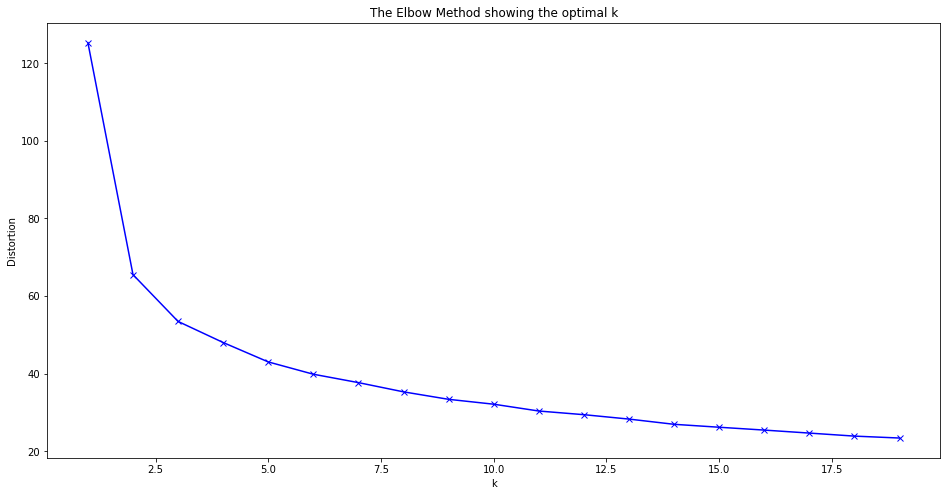

In [42]:
elbowMethod(dataset_cat40_rank60_group_minmaxed)

Elbow Method를 통해 K=3 이후가 타당함을 추정해볼 수 있다.

# Silhouette Score

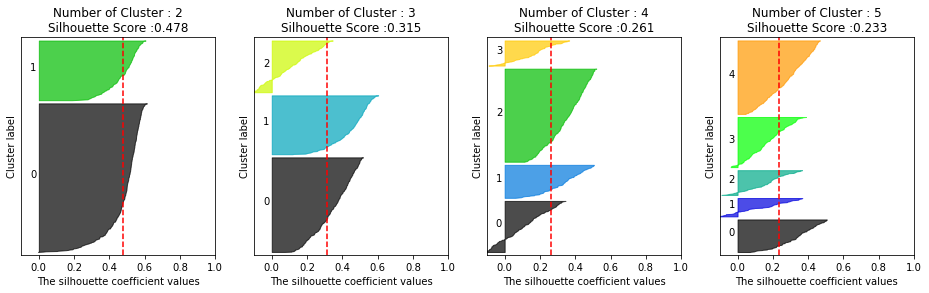

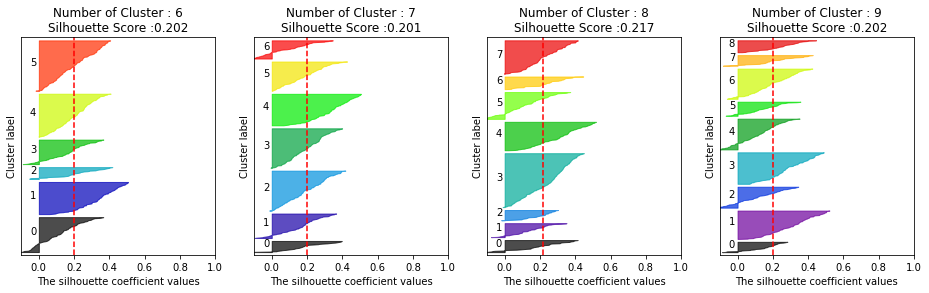

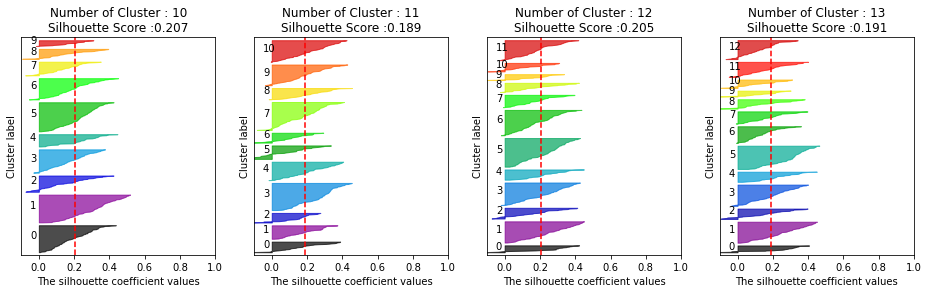

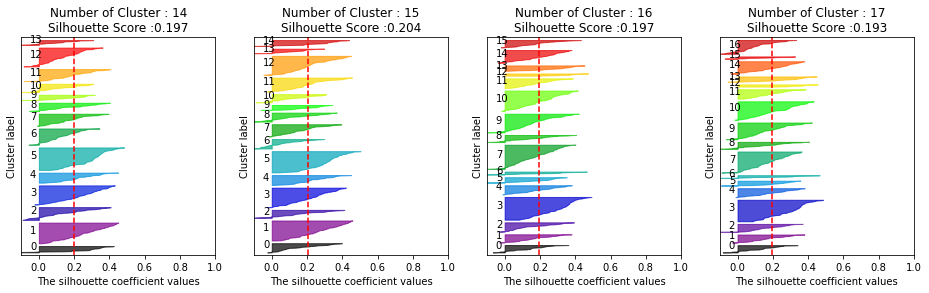

In [48]:
visualize_silhouette([ 2, 3, 4, 5], dataset_cat40_rank60_group_minmaxed)
visualize_silhouette([ 6, 7, 8, 9], dataset_cat40_rank60_group_minmaxed)
visualize_silhouette([ 10, 11, 12, 13], dataset_cat40_rank60_group_minmaxed)
visualize_silhouette([ 14, 15, 16, 17], dataset_cat40_rank60_group_minmaxed)

이상값을 확인 시, K=8에서 변화 양상이 특이함

K-means Clustering을 K=4, 5, 8에 대해서 진행

# K-means Clustering

## cat : rank = 40 : 60 dataset K-means Clustering

### K=4

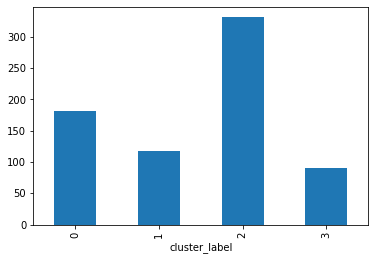

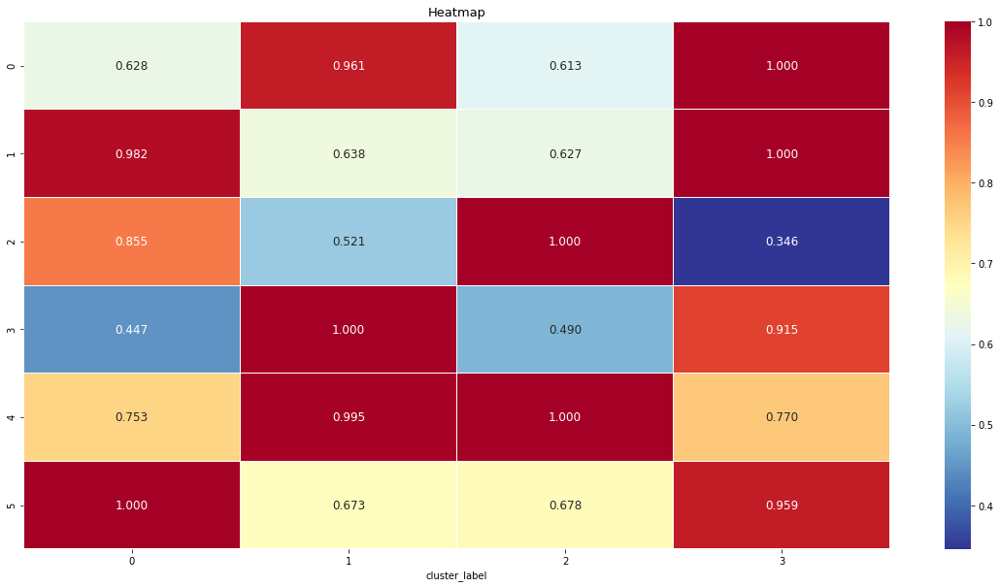

Silhouette Coefficient: 0.2615
Davies Bouldin Index: 1.5265


In [53]:
clustering(4,dataset_cat40_rank60_group_minmaxed, 6, "Kmeans_cat40_rank_60_group_minmaxed_K4_20210919")
dataset_cat40_rank60_group_minmaxed
dataset_cat40_rank60_group_minmaxed.to_excel(excel_writer='dataset_cat40_rank60_group_minmaxed_K4_20210919.xlsx')

In [54]:
dataset_cat40_rank60_group_minmaxed

,sensitive,unprepared,media sharing,challenge,flex,quick,cluster_label
0,0.245188,0.291502,0.864389,0.529345,0.841255,0.129494,2
1,0.630938,0.548896,0.328779,0.859799,0.654325,0.463672,3
2,0.513464,0.465508,0.884813,0.480165,0.584283,0.269051,2
3,0.540352,0.330956,0.535263,0.862114,0.806216,0.378988,1
4,0.305158,0.418863,0.783901,0.419247,0.736291,0.302659,2
...,...,...,...,...,...,...,...
716,0.330473,0.350417,0.868108,0.426889,0.814892,0.187406,2
717,0.466895,0.459279,0.882551,0.452292,0.594733,0.431773,0
718,0.294252,0.138944,0.887093,0.206406,0.895767,0.245317,2
719,0.736954,0.635206,0.252279,0.812967,0.400321,0.378988,3


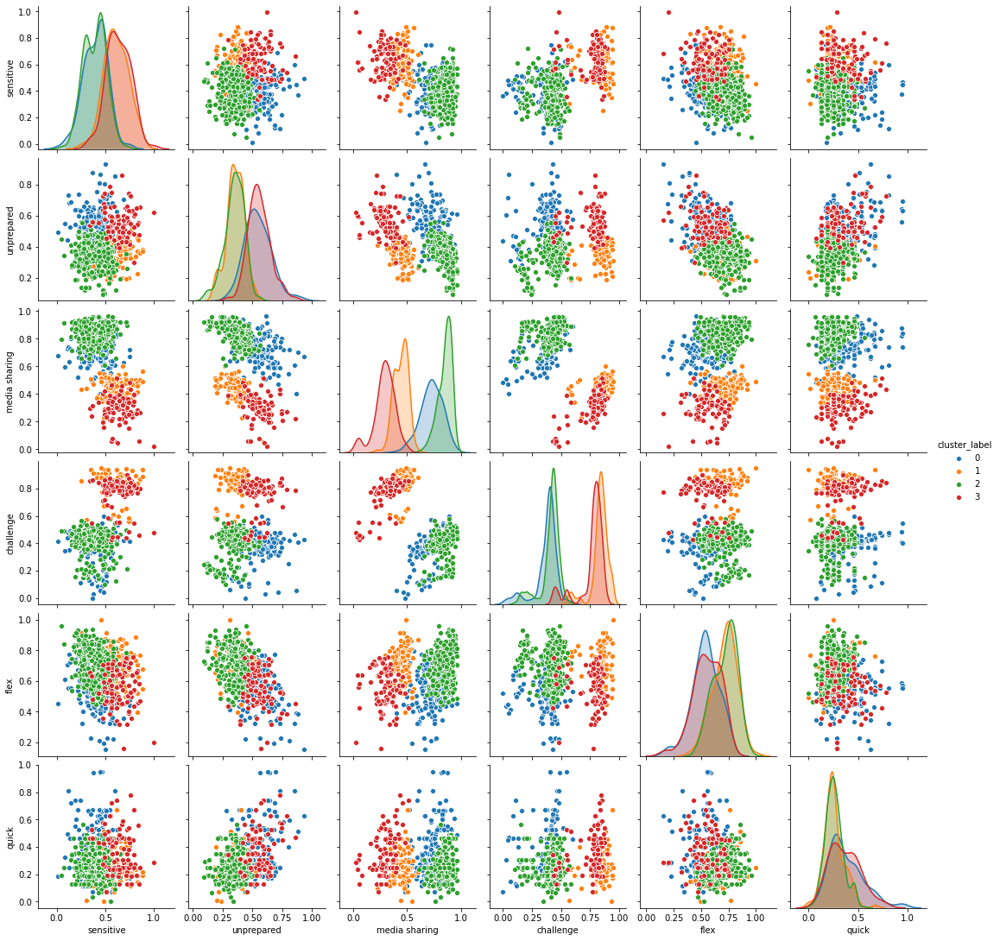

In [55]:
sns.pairplot(dataset_cat40_rank60_group_minmaxed,hue='cluster_label')
plt.show()

그룹 유형으로 Clustering (K=4) 진행한 결과에 대한 세부 유형 변수 특징 파악

In [65]:
dataset_rank_several_total_20210919_minMaxScaled_K4_cluster_label = pd.read_excel("dataset_rank_several_total_20210919_minMaxScaled_K4_cluster_label.xlsx", sheet_name = 'Sheet1',
                             header = 0,
                             index_col = None,
                             usecols="B:V")
dataset_rank_several_total_20210919_minMaxScaled_K4_cluster_label

,restaurant insuitive,external impact,help request,improvised selective,newness seeking,food sharing,visual oriented,avoiding communication,accommodation investment,accommodation selfstand,...,fast seeking,service experience,uncomfortable avoidance,plan irregularity,cafe improvisation,review verification,emotional photography,local expericence,cafe investment,cluster_label
0,0.198312,0.771203,0.689922,0.594595,0.988350,0.88640,0.784722,0.280120,0.279221,0.715356,...,0.015823,0.973684,0.747664,0.783784,0.107810,0.899057,0.542254,0.656085,1.000000,2
1,0.864979,0.510848,0.472868,0.751843,1.000000,0.77280,0.569444,0.871235,0.151515,0.399064,...,0.572785,0.921053,1.000000,1.000000,0.466893,0.479245,0.488934,0.549206,0.481637,3
2,0.581646,0.537870,0.490698,0.640049,0.954693,0.88080,0.804398,0.727410,0.363636,0.451685,...,0.248418,0.769737,0.551402,0.743243,0.175236,0.826550,0.731963,0.785185,0.810223,2
3,0.700633,0.461538,0.190698,0.594595,0.988350,0.88640,0.784722,0.601155,0.361472,0.334738,...,0.431646,0.752632,0.564486,0.745946,0.022581,0.972830,0.886117,0.886772,0.894229,1
4,0.432489,0.583826,0.503876,0.612039,0.879871,0.79872,0.700000,0.545055,0.363997,0.397784,...,0.304430,0.855263,0.562617,0.794595,0.385702,0.629852,0.520839,0.560469,0.612127,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
716,0.664557,0.642998,0.118863,0.646192,0.896440,0.77360,0.614583,0.590361,0.226190,0.482210,...,0.112342,0.986842,0.710280,0.878378,0.053141,0.937736,0.793159,0.777566,0.944596,2
717,0.573418,0.523471,0.314729,0.687469,0.904854,0.79328,0.674537,0.639935,0.350649,0.401529,...,0.519620,0.802632,0.672897,0.794595,0.113752,0.861887,0.888531,0.895661,0.848898,0
718,0.000000,0.656805,0.534884,0.000000,0.297087,0.65280,0.909722,0.480422,0.629870,0.108614,...,0.208861,1.000000,0.672897,0.972973,0.115789,0.861887,0.889738,0.872169,0.841343,2
719,0.574051,0.817160,0.478295,0.705405,0.845178,0.69856,0.543519,0.448795,0.261905,0.656367,...,0.431646,0.752632,0.564486,0.745946,0.611205,0.333962,0.295775,0.361905,0.287513,3


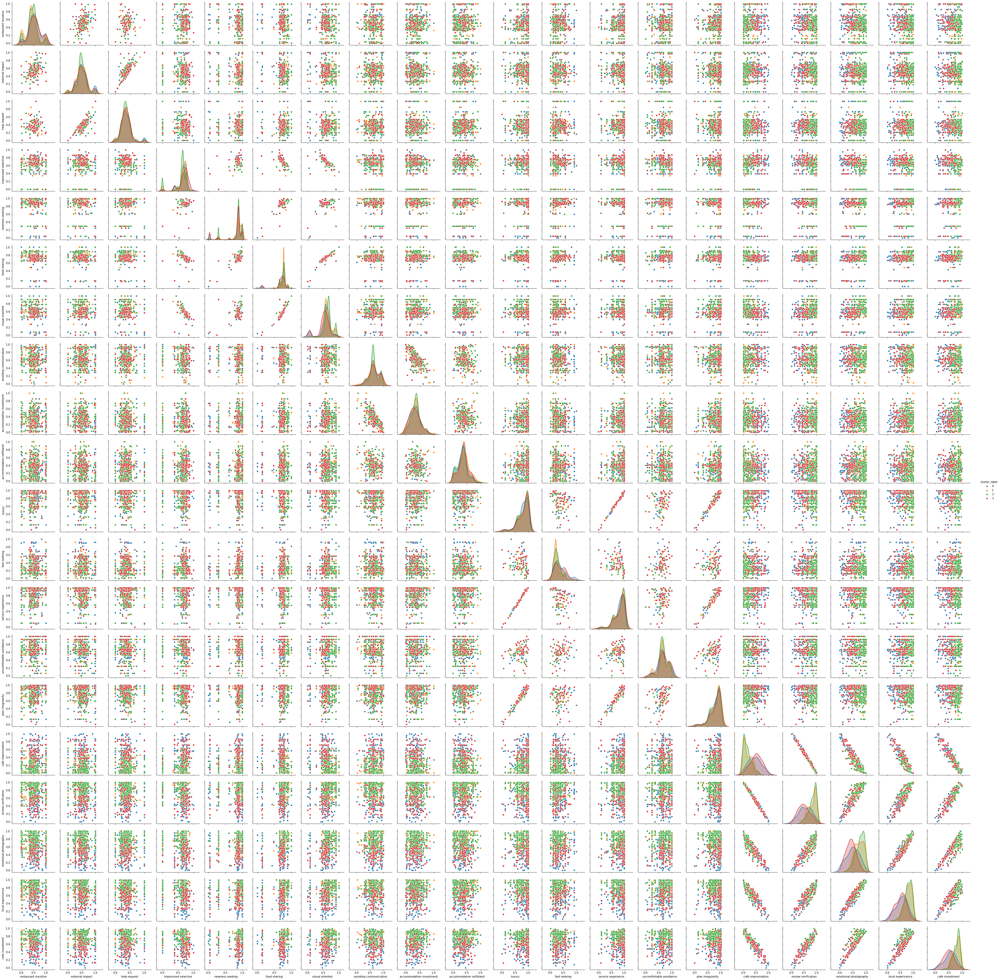

In [66]:
sns.pairplot(dataset_rank_several_total_20210919_minMaxScaled_K4_cluster_label,hue='cluster_label')
plt.show()

### K=8

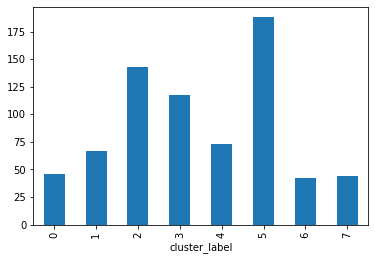

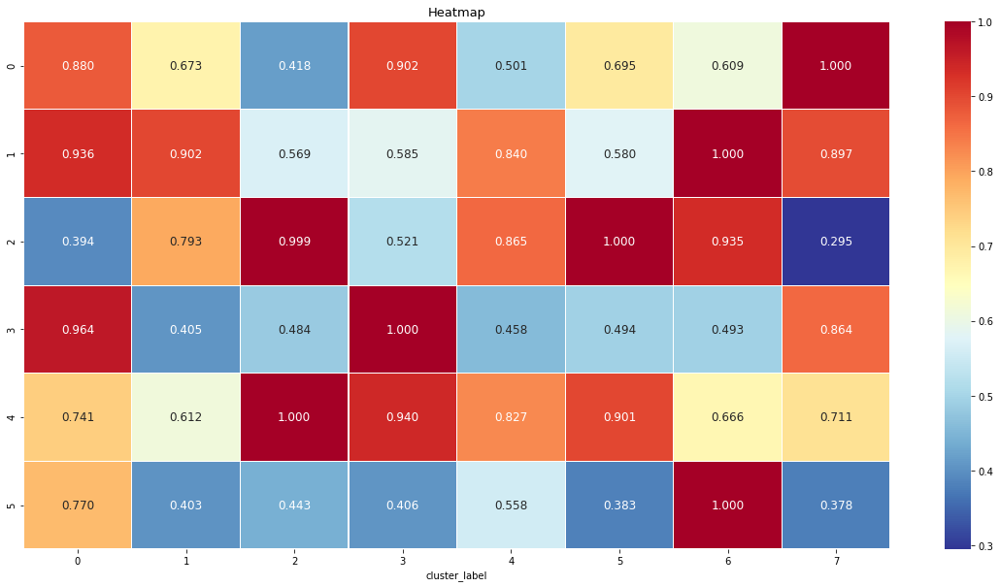

Silhouette Coefficient: 0.1832
Davies Bouldin Index: 1.6688


In [56]:
clustering(8,dataset_cat40_rank60_group_minmaxed, 6, "Kmeans_cat40_rank_60_group_minmaxed_K8_20210919")
dataset_cat40_rank60_group_minmaxed
dataset_cat40_rank60_group_minmaxed.to_excel(excel_writer='dataset_cat40_rank60_group_minmaxed_K8_20210919.xlsx')

In [57]:
dataset_cat40_rank60_group_minmaxed

,sensitive,unprepared,media sharing,challenge,flex,quick,cluster_label
0,0.245188,0.291502,0.864389,0.529345,0.841255,0.129494,2
1,0.630938,0.548896,0.328779,0.859799,0.654325,0.463672,0
2,0.513464,0.465508,0.884813,0.480165,0.584283,0.269051,5
3,0.540352,0.330956,0.535263,0.862114,0.806216,0.378988,3
4,0.305158,0.418863,0.783901,0.419247,0.736291,0.302659,2
...,...,...,...,...,...,...,...
716,0.330473,0.350417,0.868108,0.426889,0.814892,0.187406,2
717,0.466895,0.459279,0.882551,0.452292,0.594733,0.431773,4
718,0.294252,0.138944,0.887093,0.206406,0.895767,0.245317,2
719,0.736954,0.635206,0.252279,0.812967,0.400321,0.378988,7


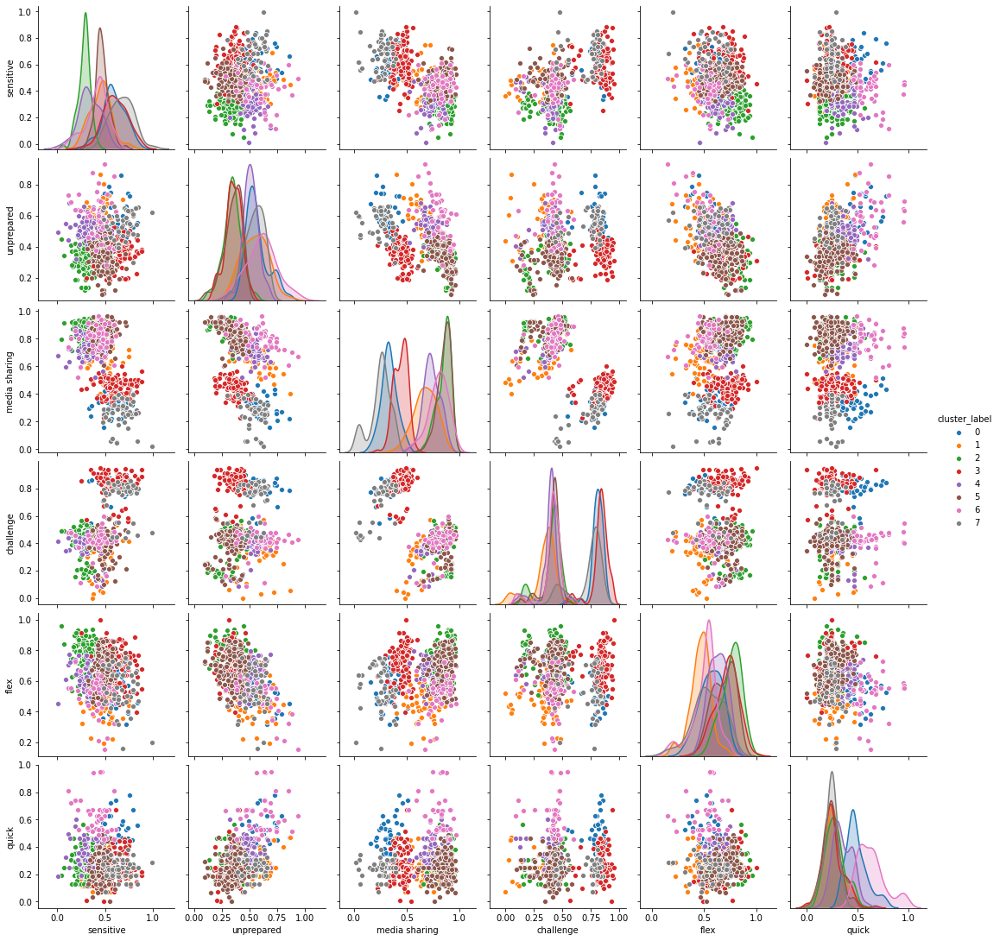

In [58]:
sns.pairplot(dataset_cat40_rank60_group_minmaxed,hue='cluster_label')
plt.show()

그룹 유형으로 Clustering (K=8) 진행한 결과에 대한 세부 유형 변수 특징 파악

In [67]:
dataset_rank_several_total_20210919_minMaxScaled_K8_cluster_label = pd.read_excel("dataset_rank_several_total_20210919_minMaxScaled_K8_cluster_label.xlsx", sheet_name = 'Sheet1',
                             header = 0,
                             index_col = None,
                             usecols="B:V")
dataset_rank_several_total_20210919_minMaxScaled_K8_cluster_label

,restaurant insuitive,external impact,help request,improvised selective,newness seeking,food sharing,visual oriented,avoiding communication,accommodation investment,accommodation selfstand,...,fast seeking,service experience,uncomfortable avoidance,plan irregularity,cafe improvisation,review verification,emotional photography,local expericence,cafe investment,cluster_label
0,0.198312,0.771203,0.689922,0.594595,0.988350,0.88640,0.784722,0.280120,0.279221,0.715356,...,0.015823,0.973684,0.747664,0.783784,0.107810,0.899057,0.542254,0.656085,1.000000,2
1,0.864979,0.510848,0.472868,0.751843,1.000000,0.77280,0.569444,0.871235,0.151515,0.399064,...,0.572785,0.921053,1.000000,1.000000,0.466893,0.479245,0.488934,0.549206,0.481637,0
2,0.581646,0.537870,0.490698,0.640049,0.954693,0.88080,0.804398,0.727410,0.363636,0.451685,...,0.248418,0.769737,0.551402,0.743243,0.175236,0.826550,0.731963,0.785185,0.810223,5
3,0.700633,0.461538,0.190698,0.594595,0.988350,0.88640,0.784722,0.601155,0.361472,0.334738,...,0.431646,0.752632,0.564486,0.745946,0.022581,0.972830,0.886117,0.886772,0.894229,3
4,0.432489,0.583826,0.503876,0.612039,0.879871,0.79872,0.700000,0.545055,0.363997,0.397784,...,0.304430,0.855263,0.562617,0.794595,0.385702,0.629852,0.520839,0.560469,0.612127,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
716,0.664557,0.642998,0.118863,0.646192,0.896440,0.77360,0.614583,0.590361,0.226190,0.482210,...,0.112342,0.986842,0.710280,0.878378,0.053141,0.937736,0.793159,0.777566,0.944596,2
717,0.573418,0.523471,0.314729,0.687469,0.904854,0.79328,0.674537,0.639935,0.350649,0.401529,...,0.519620,0.802632,0.672897,0.794595,0.113752,0.861887,0.888531,0.895661,0.848898,4
718,0.000000,0.656805,0.534884,0.000000,0.297087,0.65280,0.909722,0.480422,0.629870,0.108614,...,0.208861,1.000000,0.672897,0.972973,0.115789,0.861887,0.889738,0.872169,0.841343,2
719,0.574051,0.817160,0.478295,0.705405,0.845178,0.69856,0.543519,0.448795,0.261905,0.656367,...,0.431646,0.752632,0.564486,0.745946,0.611205,0.333962,0.295775,0.361905,0.287513,7


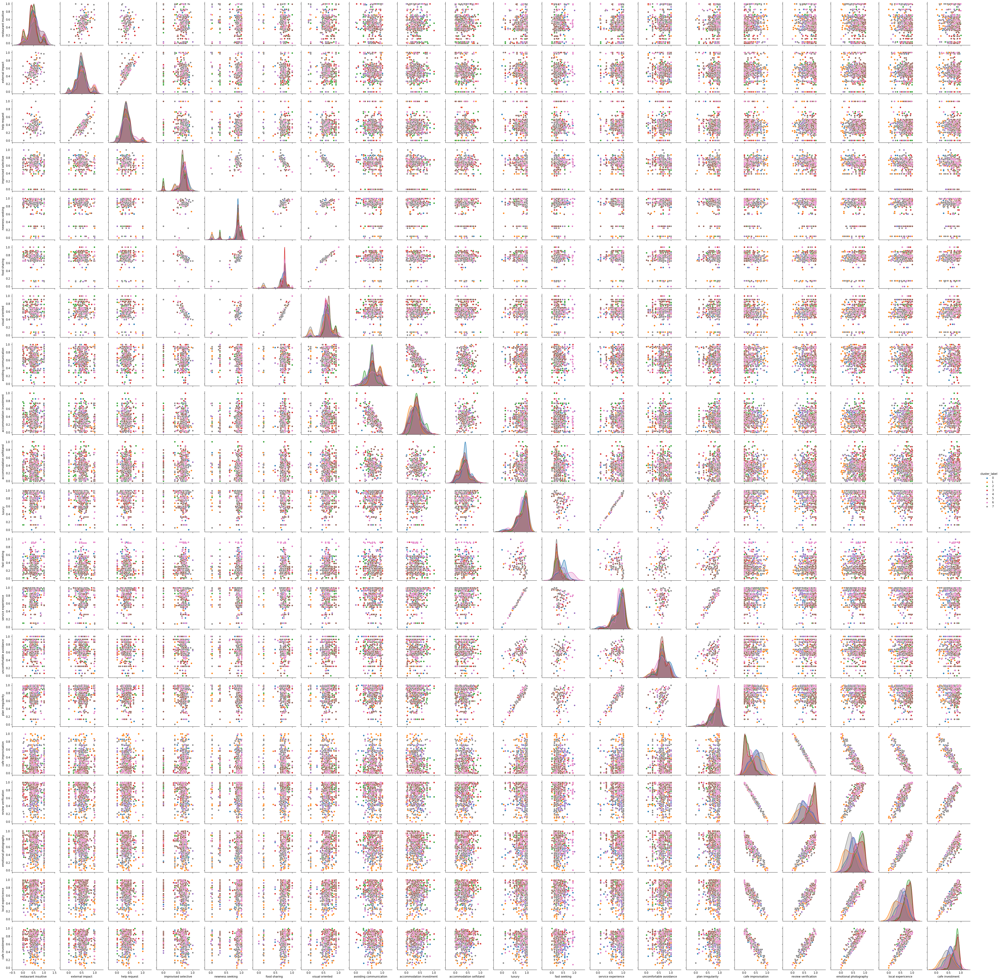

In [68]:
sns.pairplot(dataset_rank_several_total_20210919_minMaxScaled_K8_cluster_label,hue='cluster_label')
plt.show()

# Hexagon

## 클러스터 중심점 좌표 불러와 Hexagon 표현하기

### K=4

cat : rank = 40 : 60 데이터셋

In [59]:
Kmeans_cat40_rank60_group_K4_minmax = pd.read_excel("Kmeans_cat40_rank_60_group_minmaxed_K4_20210919.xlsx", sheet_name = 'Sheet1',
                             header = 0,
                             index_col = None,
                             usecols="B:G")
Kmeans_cat40_rank60_group_K4_minmax

,sensitive,unprepared,media sharing,challenge,flex,quick
0,0.399967,0.547149,0.729274,0.372686,0.542117,0.383085
1,0.612309,0.355797,0.444321,0.834334,0.716256,0.257932
2,0.390867,0.349706,0.853184,0.408627,0.719634,0.259809
3,0.637159,0.557404,0.294785,0.763376,0.554001,0.367556


Cluster 0


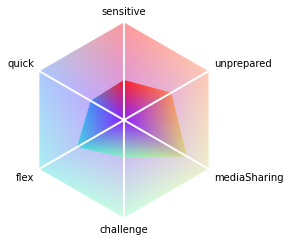

Cluster 1


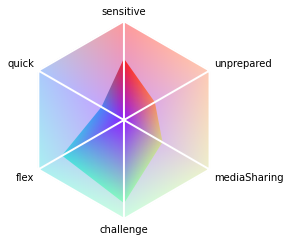

Cluster 2


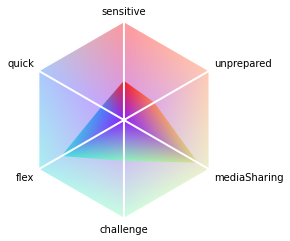

Cluster 3


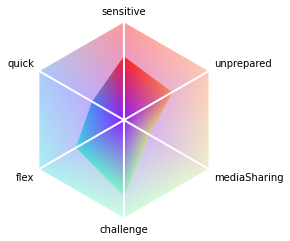

In [62]:
for i in range(4):
    row_data_list = Kmeans_cat40_rank60_group_K4_minmax.iloc[i,:].tolist()
    print('Cluster', i)
    plot_hexagon(row_data_list)

### K=8

cat : rank = 40 : 60 데이터셋

In [63]:
Kmeans_cat40_rank60_group_K8_minmax = pd.read_excel("Kmeans_cat40_rank_60_group_minmaxed_K8_20210919.xlsx", sheet_name = 'Sheet1',
                             header = 0,
                             index_col = None,
                             usecols="B:G")
Kmeans_cat40_rank60_group_K8_minmax

,sensitive,unprepared,media sharing,challenge,flex,quick
0,0.597207,0.568920,0.336174,0.804296,0.565254,0.489570
1,0.456667,0.548549,0.676745,0.338235,0.466901,0.255964
2,0.283965,0.345993,0.852702,0.404175,0.762369,0.281611
3,0.612309,0.355797,0.444321,0.834334,0.716256,0.257932
4,0.340123,0.510912,0.738126,0.381863,0.630717,0.354532
5,0.472180,0.352530,0.853550,0.412014,0.687128,0.243226
6,0.413531,0.607900,0.797682,0.411694,0.508107,0.635501
7,0.678926,0.545364,0.251514,0.720595,0.542237,0.239996


Cluster 0


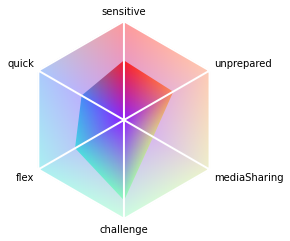

Cluster 1


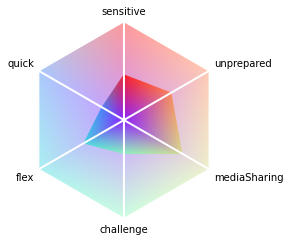

Cluster 2


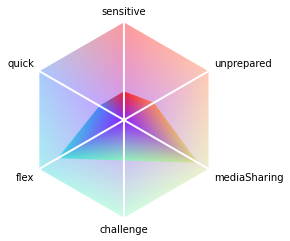

Cluster 3


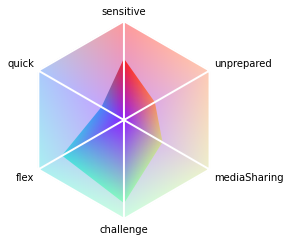

Cluster 4


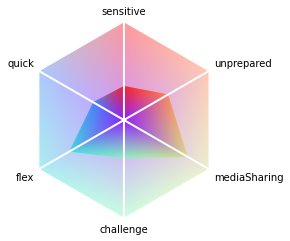

Cluster 5


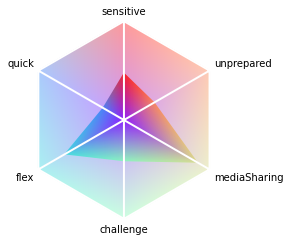

Cluster 6


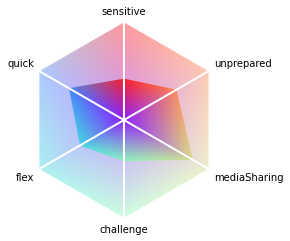

Cluster 7


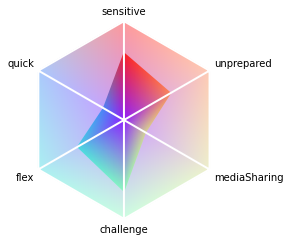

In [64]:
for i in range(8):
    row_data_list = Kmeans_cat40_rank60_group_K8_minmax.iloc[i,:].tolist()
    print('Cluster', i)
    plot_hexagon(row_data_list)